In [39]:
import os
import math
import warnings
warnings.filterwarnings("ignore")

import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import preprocessing
from matplotlib_venn import venn3, venn2
from plotly import tools
from IPython.core import display as ICD
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

init_notebook_mode(connected=True)
pd.set_option('display.max_columns', 5000)

In [2]:
df = pd.read_csv('/Users/kaitaidong/Downloads/kaggle-survey-2018/multipleChoiceResponses.csv').iloc[1:,:]
df.head()

,Time from Start to Finish (seconds),Q1,Q1_OTHER_TEXT,Q2,Q3,Q4,Q5,Q6,Q6_OTHER_TEXT,Q7,Q7_OTHER_TEXT,Q8,Q9,Q10,Q11_Part_1,Q11_Part_2,Q11_Part_3,Q11_Part_4,Q11_Part_5,Q11_Part_6,Q11_Part_7,Q11_OTHER_TEXT,Q12_MULTIPLE_CHOICE,Q12_Part_1_TEXT,Q12_Part_2_TEXT,Q12_Part_3_TEXT,Q12_Part_4_TEXT,Q12_Part_5_TEXT,Q12_OTHER_TEXT,Q13_Part_1,Q13_Part_2,Q13_Part_3,Q13_Part_4,Q13_Part_5,Q13_Part_6,Q13_Part_7,Q13_Part_8,Q13_Part_9,Q13_Part_10,Q13_Part_11,Q13_Part_12,Q13_Part_13,Q13_Part_14,Q13_Part_15,Q13_OTHER_TEXT,Q14_Part_1,Q14_Part_2,Q14_Part_3,Q14_Part_4,Q14_Part_5,Q14_Part_6,Q14_Part_7,Q14_Part_8,Q14_Part_9,Q14_Part_10,Q14_Part_11,Q14_OTHER_TEXT,Q15_Part_1,Q15_Part_2,Q15_Part_3,Q15_Part_4,Q15_Part_5,Q15_Part_6,Q15_Part_7,Q15_OTHER_TEXT,Q16_Part_1,Q16_Part_2,Q16_Part_3,Q16_Part_4,Q16_Part_5,Q16_Part_6,Q16_Part_7,Q16_Part_8,Q16_Part_9,Q16_Part_10,Q16_Part_11,Q16_Part_12,Q16_Part_13,Q16_Part_14,Q16_Part_15,Q16_Part_16,Q16_Part_17,Q16_Part_18,Q16_OTHER_TEXT,Q17,Q17_OTHER_TEXT,Q18,Q18_OTHER_TEXT,Q19_Part_1,Q19_Part_2,Q19_Part_3,Q19_Part_4,Q19_Part_5,Q19_Part_6,Q19_Part_7,Q19_Part_8,Q19_Part_9,Q19_Part_10,Q19_Part_11,Q19_Part_12,Q19_Part_13,Q19_Part_14,Q19_Part_15,Q19_Part_16,Q19_Part_17,Q19_Part_18,Q19_Part_19,Q19_OTHER_TEXT,Q20,Q20_OTHER_TEXT,Q21_Part_1,Q21_Part_2,Q21_Part_3,Q21_Part_4,Q21_Part_5,Q21_Part_6,Q21_Part_7,Q21_Part_8,Q21_Part_9,Q21_Part_10,Q21_Part_11,Q21_Part_12,Q21_Part_13,Q21_OTHER_TEXT,Q22,Q22_OTHER_TEXT,Q23,Q24,Q25,Q26,Q27_Part_1,Q27_Part_2,Q27_Part_3,Q27_Part_4,Q27_Part_5,Q27_Part_6,Q27_Part_7,Q27_Part_8,Q27_Part_9,Q27_Part_10,Q27_Part_11,Q27_Part_12,Q27_Part_13,Q27_Part_14,Q27_Part_15,Q27_Part_16,Q27_Part_17,Q27_Part_18,Q27_Part_19,Q27_Part_20,Q27_OTHER_TEXT,Q28_Part_1,Q28_Part_2,Q28_Part_3,Q28_Part_4,Q28_Part_5,Q28_Part_6,Q28_Part_7,Q28_Part_8,Q28_Part_9,Q28_Part_10,Q28_Part_11,Q28_Part_12,Q28_Part_13,Q28_Part_14,Q28_Part_15,Q28_Part_16,Q28_Part_17,Q28_Part_18,Q28_Part_19,Q28_Part_20,Q28_Part_21,Q28_Part_22,Q28_Part_23,Q28_Part_24,Q28_Part_25,Q28_Part_26,Q28_Part_27,Q28_Part_28,Q28_Part_29,Q28_Part_30,Q28_Part_31,Q28_Part_32,Q28_Part_33,Q28_Part_34,Q28_Part_35,Q28_Part_36,Q28_Part_37,Q28_Part_38,Q28_Part_39,Q28_Part_40,Q28_Part_41,Q28_Part_42,Q28_Part_43,Q28_OTHER_TEXT,Q29_Part_1,Q29_Part_2,Q29_Part_3,Q29_Part_4,Q29_Part_5,Q29_Part_6,Q29_Part_7,Q29_Part_8,Q29_Part_9,Q29_Part_10,Q29_Part_11,Q29_Part_12,Q29_Part_13,Q29_Part_14,Q29_Part_15,Q29_Part_16,Q29_Part_17,Q29_Part_18,Q29_Part_19,Q29_Part_20,Q29_Part_21,Q29_Part_22,Q29_Part_23,Q29_Part_24,Q29_Part_25,Q29_Part_26,Q29_Part_27,Q29_Part_28,Q29_OTHER_TEXT,Q30_Part_1,Q30_Part_2,Q30_Part_3,Q30_Part_4,Q30_Part_5,Q30_Part_6,Q30_Part_7,Q30_Part_8,Q30_Part_9,Q30_Part_10,Q30_Part_11,Q30_Part_12,Q30_Part_13,Q30_Part_14,Q30_Part_15,Q30_Part_16,Q30_Part_17,Q30_Part_18,Q30_Part_19,Q30_Part_20,Q30_Part_21,Q30_Part_22,Q30_Part_23,Q30_Part_24,Q30_Part_25,Q30_OTHER_TEXT,Q31_Part_1,Q31_Part_2,Q31_Part_3,Q31_Part_4,Q31_Part_5,Q31_Part_6,Q31_Part_7,Q31_Part_8,Q31_Part_9,Q31_Part_10,Q31_Part_11,Q31_Part_12,Q31_OTHER_TEXT,Q32,Q32_OTHER,Q33_Part_1,Q33_Part_2,Q33_Part_3,Q33_Part_4,Q33_Part_5,Q33_Part_6,Q33_Part_7,Q33_Part_8,Q33_Part_9,Q33_Part_10,Q33_Part_11,Q33_OTHER_TEXT,Q34_Part_1,Q34_Part_2,Q34_Part_3,Q34_Part_4,Q34_Part_5,Q34_Part_6,Q34_OTHER_TEXT,Q35_Part_1,Q35_Part_2,Q35_Part_3,Q35_Part_4,Q35_Part_5,Q35_Part_6,Q35_OTHER_TEXT,Q36_Part_1,Q36_Part_2,Q36_Part_3,Q36_Part_4,Q36_Part_5,Q36_Part_6,Q36_Part_7,Q36_Part_8,Q36_Part_9,Q36_Part_10,Q36_Part_11,Q36_Part_12,Q36_Part_13,Q36_OTHER_TEXT,Q37,Q37_OTHER_TEXT,Q38_Part_1,Q38_Part_2,Q38_Part_3,Q38_Part_4,Q38_Part_5,Q38_Part_6,Q38_Part_7,Q38_Part_8,Q38_Part_9,Q38_Part_10,Q38_Part_11,Q38_Part_12,Q38_Part_13,Q38_Part_14,Q38_Part_15,Q38_Part_16,Q38_Part_17,Q38_Part_18,Q38_Part_19,Q38_Part_20,Q38_Part_21,Q38_Part_22,Q38_OTHER_TEXT,Q39_Part_1,Q39_Part_2,Q40,Q41_Part_1,Q41_Part_2,Q41_Part_3,Q42_Part_1,Q42_Part_2,Q42_Part_3,Q42_Part_4,Q42_Part_5,Q42_OTHER_TEXT,Q43,Q44_Part_1,Q44_Part_2,Q44_Part_3,Q44_Part_4,Q44_Part_5,Q44_Part_6,Q45_Part_1,Q45_Part_2,Q45_P

In [6]:
df[['Q13_Part_1','Q13_Part_2','Q13_Part_3','Q13_Part_4','Q13_Part_5',
             'Q13_Part_6','Q13_Part_7','Q13_Part_8','Q13_Part_9','Q13_Part_10',
             'Q13_Part_11','Q13_Part_12','Q13_Part_13','Q13_Part_14','Q13_Part_15']].drop(0) # drop the first row

,Q13_Part_1,Q13_Part_2,Q13_Part_3,Q13_Part_4,Q13_Part_5,Q13_Part_6,Q13_Part_7,Q13_Part_8,Q13_Part_9,Q13_Part_10,Q13_Part_11,Q13_Part_12,Q13_Part_13,Q13_Part_14,Q13_Part_15
1,Jupyter/IPython,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,MATLAB,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Jupyter/IPython,RStudio,PyCharm,NaN,NaN,NaN,NaN,Visual Studio,NaN,NaN,Vim,NaN,NaN,NaN,NaN
5,NaN,RStudio,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Jupyter/IPython,NaN,NaN,NaN,NaN,Atom,NaN,NaN,NaN,NaN,Vim,NaN,NaN,NaN,NaN
7,NaN,RStudio,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Jupyter/IPython,NaN,PyCharm,NaN,NaN,Atom,NaN,Visual Studio,Notepad++,Sublime Text,NaN,IntelliJ,Spyder,NaN,NaN
9,Jupyter/IPython,NaN,NaN,NaN,NaN,NaN,MATLAB,Visual Studio,NaN,NaN,NaN,NaN,Spyder,NaN,NaN
10,Jupyter/IPython,NaN,PyCharm,Visual Studio Code,NaN,NaN,NaN,Visual Studio,NaN,Sublime Text,NaN,IntelliJ,NaN,NaN,NaN


In [3]:
# Pull just IDE Questions
ide_qs = df[['Q13_Part_1','Q13_Part_2','Q13_Part_3','Q13_Part_4','Q13_Part_5',
             'Q13_Part_6','Q13_Part_7','Q13_Part_8','Q13_Part_9','Q13_Part_10',
             'Q13_Part_11','Q13_Part_12','Q13_Part_13','Q13_Part_14','Q13_Part_15']].drop(0)

# Rename Columns for IDE Type
column_rename = {'Q13_Part_1': 'Jupyter/IPython',
                 'Q13_Part_2': 'RStudio',
                'Q13_Part_3': 'PyCharm',
                'Q13_Part_4': 'Visual Studio Code',
                'Q13_Part_5': 'nteract',
                'Q13_Part_6': 'Atom',
                'Q13_Part_7': 'MATLAB',
                'Q13_Part_8': 'Visual Studio',
                'Q13_Part_9': 'Notepad++',
                'Q13_Part_10': 'Sublime Text',
                'Q13_Part_11': 'Vim',
                'Q13_Part_12': 'IntelliJ',
                'Q13_Part_13': 'Spyder',
                'Q13_Part_14': 'None',
                'Q13_Part_15': 'Other',
                }

# Make binary columns from IDE answers.
ide_qs_binary = ide_qs.rename(columns=column_rename).fillna(0).replace('[^\\d]',1, regex=True)
df_and_ide = pd.concat([df.drop(0), ide_qs_binary], axis=1)

In [3]:
CONSIDERED_JOB_TITLE = ['Business Analyst', 'Chief Officer', 'Consultant',
       'DBA/Database Engineer', 'Data Analyst', 'Data Engineer',
       'Data Journalist', 'Data Scientist', 'Developer Advocate',
       'Manager', 'Marketing Analyst','Principal Investigator', 'Product/Project Manager',
       'Research Assistant', 'Research Scientist', 'Salesperson',
       'Software Engineer', 'Statistician']

df_jobs = df.loc[df["Q6"].isin(CONSIDERED_JOB_TITLE)]

In [4]:
df_plot = df_jobs['Q6'].value_counts(ascending=True)  # or use plot_df[::-1] to reverse the order

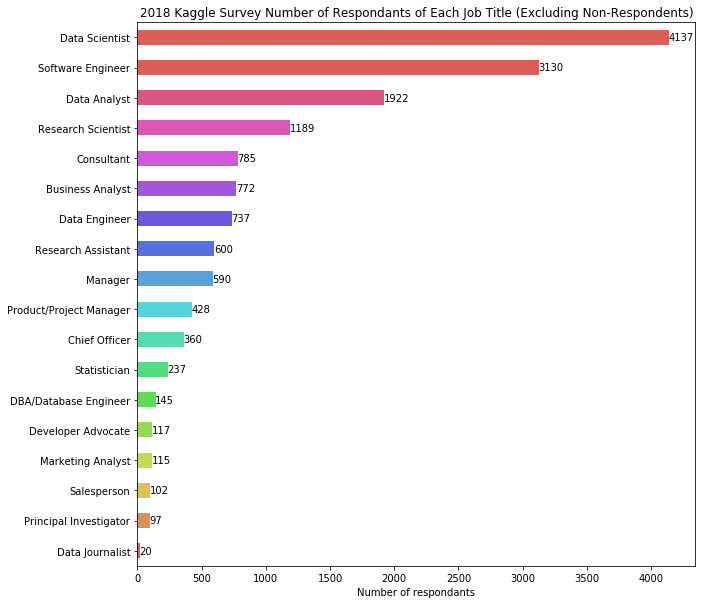

In [6]:
color_pal = sns.color_palette('hls', 16)
ax = df_plot.plot(kind='barh', figsize=(10, 10),
          title='2018 Kaggle Survey Number of Respondants of Each Job Title (Excluding Non-Respondents)',
          color=color_pal)
for i, (p, pr) in enumerate(zip(df_plot.index, df_plot.values)):
    plt.text(s=str(pr), x=pr-5, y=i, color="k",
             verticalalignment="center", horizontalalignment="left", size=10)
ax.set_xlabel("Number of respondants")
plt.show()

In [7]:
# Create another pd.Series to show the percentage of each category
df_plot_perc = pd.Series((df_plot.values / df_plot.sum() *100).round(2), index = df_plot.index)

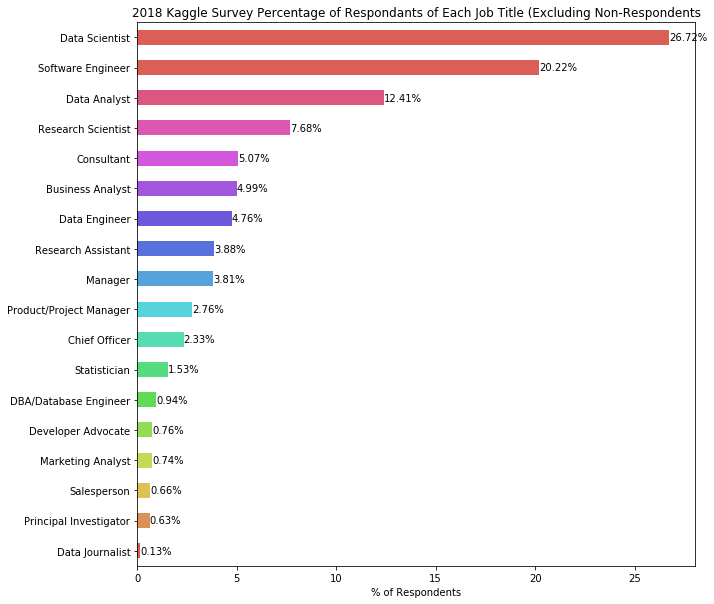

In [8]:
ax = df_plot_perc.plot(kind='barh', figsize=(10, 10),
          title='2018 Kaggle Survey Percentage of Respondants of Each Job Title (Excluding Non-Respondents',
          color=color_pal)
for i, (p, pr) in enumerate(zip(df_plot_perc.index, df_plot_perc.values)):
    plt.text(s=str(pr)+"%", x=pr, y=i, color="k",
             verticalalignment="center", horizontalalignment="left", size=10)
ax.set_xlabel("% of Respondents")
plt.show()

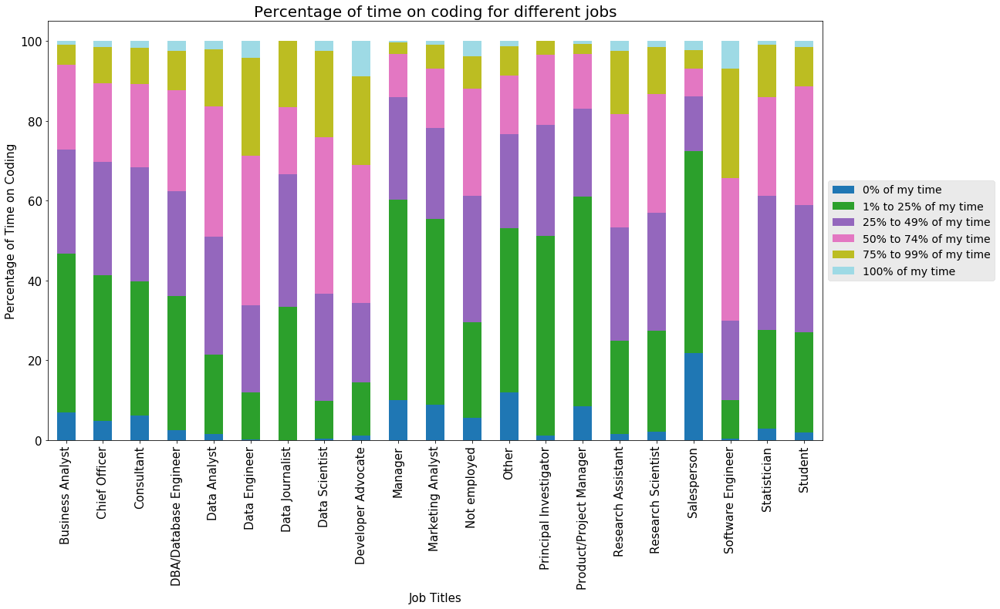

In [9]:
CODING_TIME = ['0% of my time', '1% to 25% of my time',
       '25% to 49% of my time','50% to 74% of my time', 
       '75% to 99% of my time', '100% of my time']

df[["Q6", "Q23"]]\
        .dropna().groupby(["Q6", "Q23"]).size()\
        .groupby("Q6").apply(lambda x: 100 * x / float(x.sum()))\
        .unstack(1)[CODING_TIME]\
        .plot(kind="bar", stacked=True, figsize=(18, 10), 
              fontsize=15, colormap=plt.get_cmap("tab20")
             )

plt.style.use("ggplot")
plt.title("Percentage of time on coding for different jobs", fontsize=20)
plt.ylabel("Percentage of Time on Coding", fontsize=15)
plt.xlabel("Job Titles", fontsize=15)
plt.legend(loc="center left", bbox_to_anchor=(1.0, 0.5), fontsize=14)
plt.show()


In [10]:
df['Q4'].value_counts()

Master’s degree                                                      10855
Bachelor’s degree                                                     7083
Doctoral degree                                                       3357
Some college/university study without earning a bachelor’s degree      967
Professional degree                                                    599
I prefer not to answer                                                 345
No formal education past high school                                   232
Name: Q4, dtype: int64

In [11]:
labels = df['Q4'].value_counts().index
sizes = df['Q4'].value_counts()

Index(['Master’s degree', 'Bachelor’s degree', 'Doctoral degree',
       'Some college/university study without earning a bachelor’s degree',
       'Professional degree', 'I prefer not to answer',
       'No formal education past high school'],
      dtype='object')

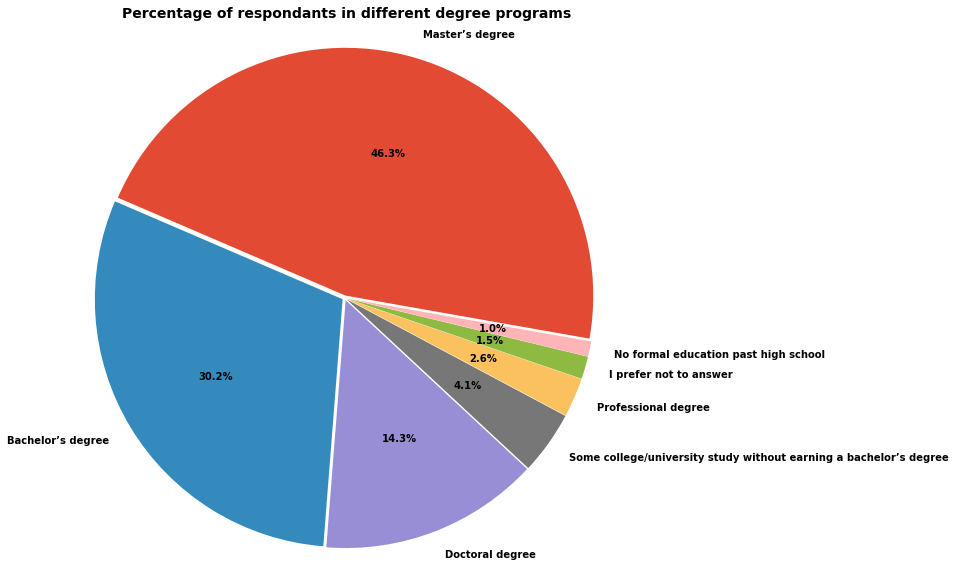

In [16]:
explode = (0.01,0.01,0.01,0.01,0.01,0.01,0.01)
fig, ax = plt.subplots(figsize=(10,10))
ax.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
       shadow=False, startangle=-10, textprops={'weight':'bold'})
ax.axis('equal')
plt.title('Percentage of respondants in different degree programs', fontsize=14, weight='bold')
plt.show()

In [21]:
df_sample = df[df['Q3']=='China']
df_sample.groupby('Q2').size()

Q2
18-21    246
22-24    611
25-29    525
30-34    147
35-39     58
40-44     32
45-49     13
50-54      3
55-59      3
60-69      1
70-79      1
80+        4
dtype: int64

In [24]:
Selected_job_titles = ['Business Analyst', 'Chief Officer', 'Consultant',
        'Data Analyst', 'Data Engineer','Data Scientist', 'Manager', 'Product/Project Manager',
       'Research Assistant', 'Research Scientist', 'Software Engineer', 'Statistician']

# find the subset of the dataset from the selected job titles
df_selected_jobs = df.loc[df["Q6"].isin(Selected_job_titles)]

job_bachelor = df_selected_jobs[df_selected_jobs['Q4'] == 'Bachelor’s degree'].groupby('Q6').size()
job_master = df_selected_jobs[df_selected_jobs['Q4'] == 'Master’s degree'].groupby('Q6').size()
job_doctor = df_selected_jobs[df_selected_jobs['Q4'] == 'Doctoral degree'].groupby('Q6').size()
job_others = df_selected_jobs[df_selected_jobs['Q4'] == 'Some college/university study without earning a bachelor’s degree'].groupby('Q6').size() 

In [25]:
job_data = pd.concat([job_bachelor,job_master,job_doctor,job_others], axis=1, sort=True)
job_data.columns = ['Bachelor','Masters','Doctoral','Others']
job_data['Total'] = job_data.sum(axis=1)


Text(0.5,1,'Number of Respondent with different levels of degrees')

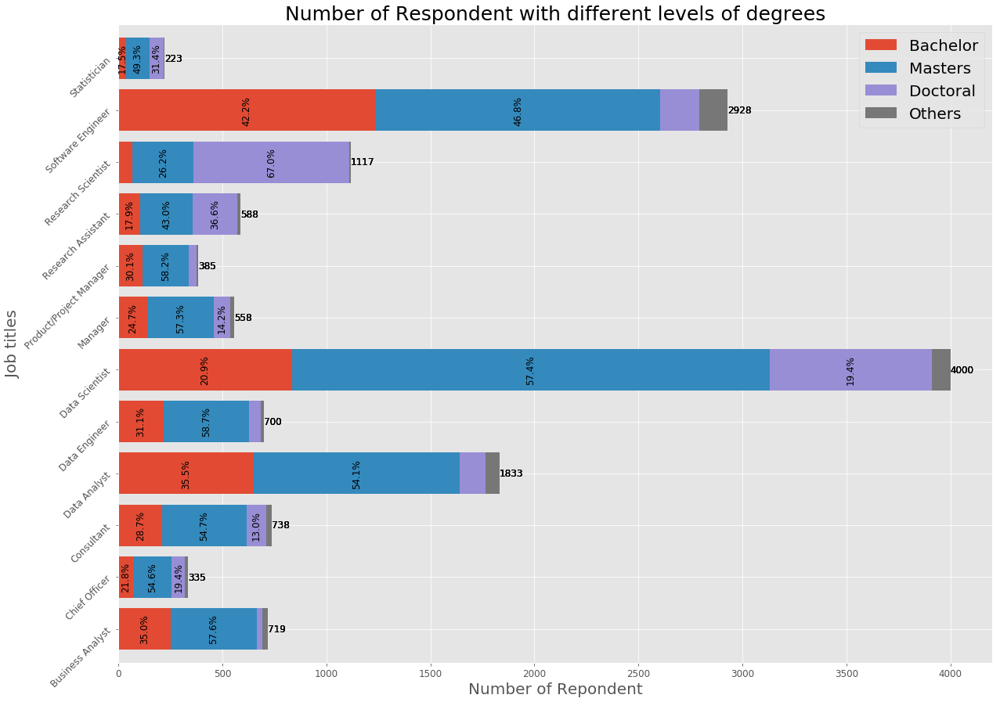

In [29]:
job_data.drop(['Total'], axis=1).plot(kind='barh',stacked=True,figsize=(20,15),width=.8)
total=job_data['Total']
df_rel = job_data[job_data.columns[0:4]].div(total,0)*100

for n in df_rel:
    for i, (cs, ab, pc, tot) in enumerate(zip(job_data.iloc[:, 0:].cumsum(1)[n], job_data[n], df_rel[n], total)):
        plt.text(tot, i, str(tot), va='center', fontsize=12)
        if pc >= 10 and tot>100:
            plt.text(cs - ab/2, i, str(np.round(pc, 1)) + '%', va='center', ha='center', fontsize=12, rotation=90)
        
plt.legend(fontsize=20)
plt.xlabel("Number of Repondent", fontsize=20)
plt.ylabel("Job titles", fontsize=20)
plt.yticks(rotation=45, fontsize=12)
plt.xticks(fontsize=12)
plt.title("Number of Respondent with different levels of degrees", fontsize=25, color='k')    

In [30]:
CODING_YEAR = ['I have never written code and I do not want to learn',
        'I have never written code but I want to learn', '< 1 year', '1-2 years', 
        '3-5 years', '5-10 years', '10-20 years', '20-30 years', 
        '30-40 years', '40+ years']
df_code_year = df_jobs[["Q6", "Q24"]]\
        .groupby(["Q6", "Q24"])\
        .size()\
        .to_frame("counts")\
        .unstack(1)\
        .fillna(0)
df_code_year = df_code_year["counts"][CODING_YEAR]

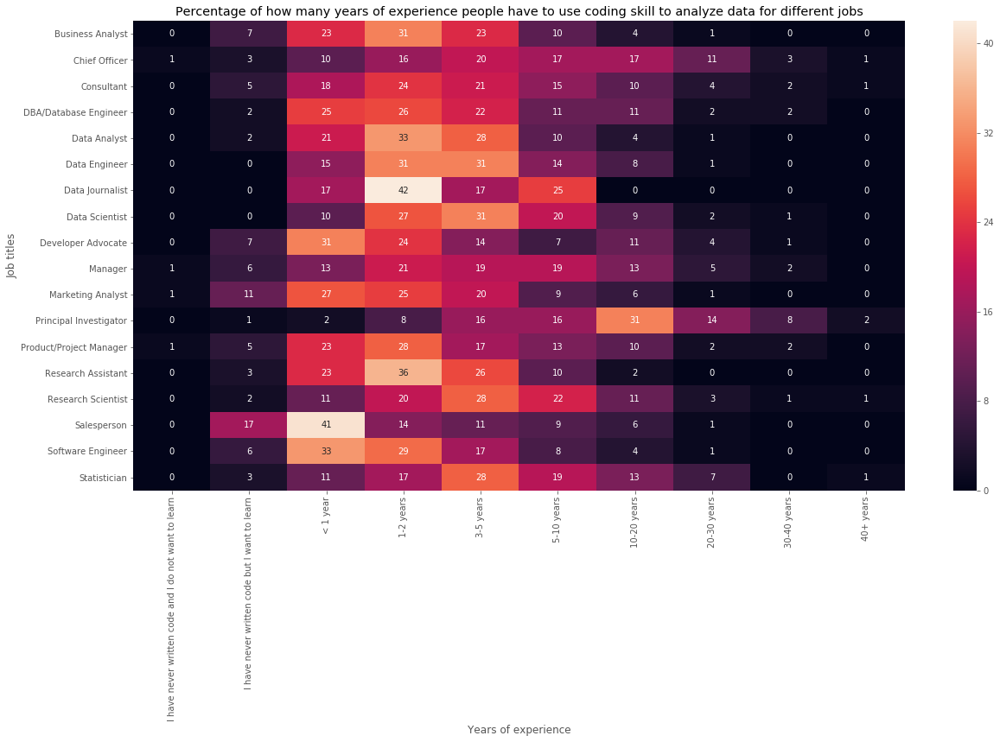

In [31]:
df_code_year = df_code_year.apply(lambda x: ((x / df_code_year.sum(axis=1)) * 100).round(0))
plt.figure(figsize=(20, 10))
sns.heatmap(df_code_year, annot=True)
_ = plt.title("Percentage of how many years of experience people have to use coding skill to analyze data for different jobs")
_ = plt.xlabel("Years of experience")
_ = plt.ylabel("Job titles")

In [32]:
WORK_DETAILS = ['Gathering data', 'Cleaning data', 
            'Visualizing data', 'Model building/model selection', 
            'Putting the model into production', 
            'Finding insights in the data and communicating with stakeholders']
df_time = df_jobs.filter(regex=("^(?!.*TEXT)(Q6|Q34)"), axis=1)\
                .dropna()
df_time.columns = ["Q6"] + WORK_DETAILS
df_time[WORK_DETAILS] = df_time[WORK_DETAILS].astype(float)

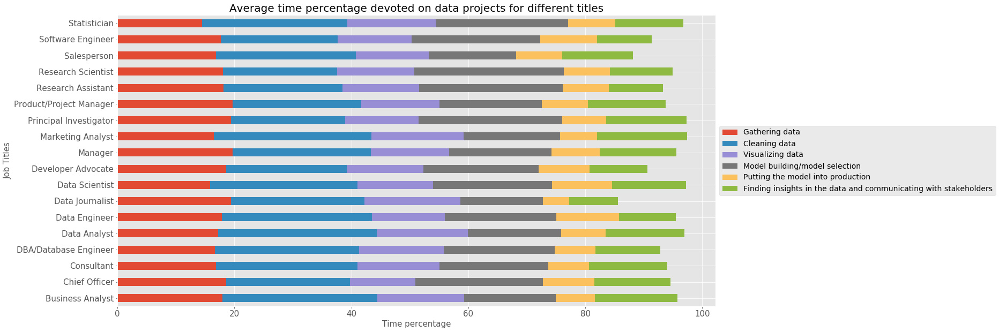

In [33]:
df_time.groupby("Q6").agg(np.mean)\
    .plot.barh(stacked=True, figsize=(20, 10), fontsize=15)

plt.title("Average time percentage devoted on data projects for different titles", fontsize=20)
plt.ylabel("Job Titles", fontsize=15)
plt.xlabel("Time percentage", fontsize=15)
plt.legend(loc="center left", bbox_to_anchor=(1.0, 0.5), fontsize=14)
plt.show()

In [34]:
job_index = df_jobs.index
df_ffr = pd.read_csv("/Users/kaitaidong/Downloads/kaggle-survey-2018/freeFormResponses.csv", low_memory=False).filter(regex="Q12").iloc[job_index, :]
drop_cols = df_ffr.columns.tolist()

In [35]:
TOOLS = ['jupyter', 'python', 'pycharm', 'anaconda', 'matlab', 'rstudio', 'visual studio', 'excel', 'docker', 'sql'
    , 'bash', 'spark', 'scala', 'emacs', 'tensor', 'torch', 'scikit', 'xgb', 'hadoop', 'jupyterlab', 'cloudera'
, 'c++', 'tableau', 'pandas', 'keras', 'ide', 'orange', 'colab', 'aws', 'mxnet', 'databricks', 'spyder', 'java',
'h2o', 'slack', 'zeppelin', 'sas', 'spss', 'nltk', 'powerbi']

df_ffr["summary"] = df_ffr.apply(lambda x: set([i for i in x if i is not np.nan]), axis=1)
df_ffr["summary"] = df_ffr["summary"].apply(lambda x: [i.lower() for i in x])
df_ffr = df_ffr[df_ffr["summary"].apply(lambda x: len(x)) == 1]



In [36]:
for t in TOOLS:
    df_ffr[t] = 0
    
for idx, r in df_ffr.iterrows():
    for t in TOOLS:
        if t in r['summary'][0]:
            df_ffr.set_value(idx, t, 1)
            
drop_cols = drop_cols + ["summary"]
df_tool = df_ffr.merge(df_jobs[['Q6']], right_index=True, left_index=True)\
        .drop(drop_cols, axis=1)

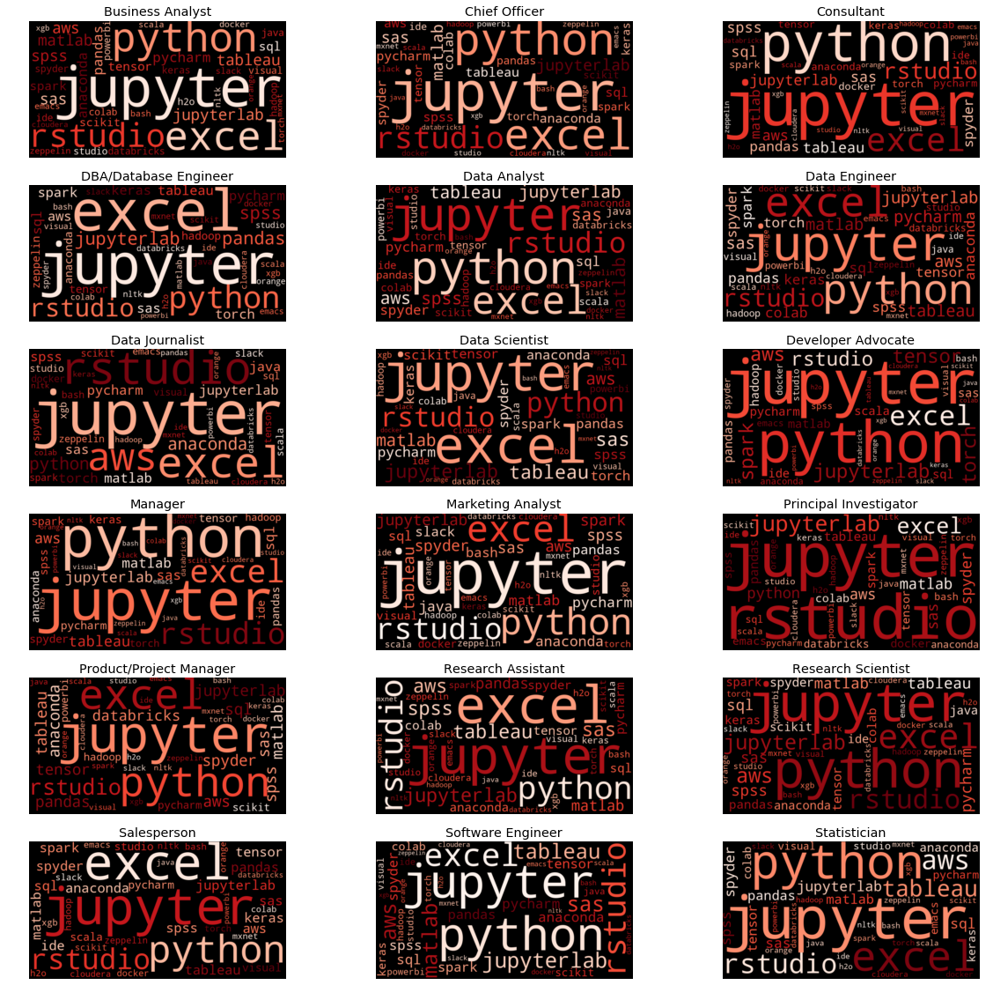

In [40]:
fig, ax = plt.subplots(nrows=6, ncols=3, sharex=True, sharey=True, figsize=(20, 20))
n = 1
for job in CONSIDERED_JOB_TITLE:
    sub_job = df_tool[df_tool["Q6"] == job]
    txt = ",".join(sub_job[TOOLS].sum(axis=0).sort_values(ascending=False).index)
    plt.subplot(6, 3, n)
    wordcloud = WordCloud(colormap="Reds", width=900, height=480,
                      normalize_plurals=False).generate(txt)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(job)
    plt.axis("off")
    n +=1
plt.subplots_adjust(hspace = 0.2)
plt.show()


In [14]:
responses = df[1:]
responses = responses[~pd.isnull(responses['Q35_Part_1'])]

In [15]:
count_dict = {
    'Self-taught' : (responses['Q35_Part_1'].astype(float)>0).sum(),
    'Online courses (Coursera, Udemy, edX, etc.)' : (responses['Q35_Part_2'].astype(float)>0).sum(),
    'Work' : (responses['Q35_Part_3'].astype(float)>0).sum(),
    'University' : (responses['Q35_Part_4'].astype(float)>0).sum(),
    'Kaggle competitions' : (responses['Q35_Part_5'].astype(float)>0).sum(),
    'Other' : (responses['Q35_Part_6'].astype(float)>0).sum()
}

cnt_srs = pd.Series(count_dict)

trace = go.Bar(
    x=cnt_srs.index,
    y=cnt_srs.values,
    marker=dict(
        color='blue',
    #    colorscale = 'Picnic',
    #    reversescale = True
    ),
)

layout = go.Layout(
    title='Number of respondents for each learning category'
)

data = [trace]
fig = go.Figure(data=data, layout=layout)
iplot(fig, filename="learningcategory")

In [16]:
responses['Q35_Part_5'].loc[responses['Q35_Part_5'].astype(float)<0] = 0   

ys = [responses['Q35_Part_1'].values, 
      responses['Q35_Part_2'].values,
      responses['Q35_Part_3'].values,
      responses['Q35_Part_4'].values,
      responses['Q35_Part_5'].values,
      responses['Q35_Part_6'].values
     ]
names = ["Self-taught",
         'Online courses (Coursera, Udemy, edX, etc.)',
         'Work',
         'University',
         'Kaggle competitions',
         'Other'
        ]
#colors = ['rgba(93, 164, 214, 0.5)', 'rgba(255, 144, 14, 0.5)', 'rgba(44, 160, 101, 0.5)', 'rgba(255, 65, 54, 0.5)', 'rgba(207, 114, 255, 0.5)', 'rgba(127, 96, 0, 0.5)']
colors = ["#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71","#df6a84"]

trace = []

for i in range(6):
    trace.append ( 
        go.Box(
            y=ys[i],
            name=names[i],
            marker = dict(
                color=colors[i],
            )
        )
    )
layout = go.Layout(
    title='Box plots on % contribution of each ML / DS training category'
)

fig = go.Figure(data=trace, layout=layout)
iplot(fig, filename="TimeSpent")

In [19]:
def get_trace(country_name):
    responses = df[1:]
    responses = responses[responses["Q3"]==country_name]
    responses['Q35_Part_5'].loc[responses['Q35_Part_5'].astype(float)<0] = 0   
    ys = [responses['Q35_Part_1'].values, 
      responses['Q35_Part_2'].values,
      responses['Q35_Part_3'].values,
      responses['Q35_Part_4'].values,
      responses['Q35_Part_5'].values,
      responses['Q35_Part_6'].values
     ]
    names = ["Self-taught",
         'Online courses (Coursera, Udemy, edX, etc.)',
         'Work',
         'University',
         'Kaggle competitions',
         'Other'
        ]
    colors = ["#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71","#df6a84"]

    trace = []

    for i in range(6):
        trace.append ( 
            go.Box(
                y=ys[i],
                name=names[i],
                marker = dict(
                    color=colors[i],
                )
            )
        )
    return trace
    
traces_list = []
country_names = ["United States of America", "India", "China", "Russia", "Brazil", "Germany",
                "United Kingdom of Great Britain and Northern Ireland", "Canada", "France", "Japan"]
for country_name in country_names:
    traces_list.append(get_trace(country_name))
    
# Creating two subplots
fig = tools.make_subplots(rows=int(len(country_names)/2), cols=2, vertical_spacing=0.1, 
                          subplot_titles=country_names)

for ind, traces in enumerate(traces_list):
    for trace in traces:
        fig.append_trace(trace, int(np.floor(ind/2)+1), int((ind%2) + 1))

fig['layout'].update(height=2000, width=800, paper_bgcolor='rgb(233,233,233)', title="% Contribution of DS / ML training by Country", showlegend=False)
iplot(fig, filename='mldscountry')

This is the format of your plot grid:
[ (1,1) x1,y1 ]    [ (1,2) x2,y2 ]  
[ (2,1) x3,y3 ]    [ (2,2) x4,y4 ]  
[ (3,1) x5,y5 ]    [ (3,2) x6,y6 ]  
[ (4,1) x7,y7 ]    [ (4,2) x8,y8 ]  
[ (5,1) x9,y9 ]    [ (5,2) x10,y10 ]



In [21]:
def get_trace(country_name):
    responses = df[1:]
    responses = responses[responses["Q6"]==country_name]
    responses['Q35_Part_5'].loc[responses['Q35_Part_5'].astype(float)<0] = 0   
    ys = [responses['Q35_Part_1'].values, 
      responses['Q35_Part_2'].values,
      responses['Q35_Part_3'].values,
      responses['Q35_Part_4'].values,
      responses['Q35_Part_5'].values,
      responses['Q35_Part_6'].values
     ]
    names = ["Self-taught",
         'Online courses (Coursera, Udemy, edX, etc.)',
         'Work',
         'University',
         'Kaggle competitions',
         'Other'
        ]
    colors = ["#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71","#df6a84"]

    trace = []

    for i in range(6):
        trace.append ( 
            go.Box(
                y=ys[i],
                name=names[i],
                marker = dict(
                    color=colors[i],
                )
            )
                    )
    return trace
    
traces_list = []
country_names = ["Student", "Data Scientist", "Software Engineer", "Data Analyst"]
for country_name in country_names:
    traces_list.append(get_trace(country_name))
    
# Creating two subplots
fig = tools.make_subplots(rows=int(len(country_names)/2), cols=2, vertical_spacing=0.2, 
                          subplot_titles=country_names)

for ind, traces in enumerate(traces_list):
    for trace in traces:
        fig.append_trace(trace, int(np.floor(ind/2)+1), int((ind%2) + 1))

fig['layout'].update(height=800, width=800, paper_bgcolor='rgb(233,233,233)', title="% Contribution of DS / ML training by Profession", showlegend=False)
iplot(fig, filename='mldscountry')

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]
[ (2,1) x3,y3 ]  [ (2,2) x4,y4 ]



In [22]:
def get_trace(country_name):
    responses = df[1:]
    responses = responses[responses["Q4"]==country_name]
    responses['Q35_Part_5'].loc[responses['Q35_Part_5'].astype(float)<0] = 0   
    ys = [responses['Q35_Part_1'].values, 
      responses['Q35_Part_2'].values,
      responses['Q35_Part_3'].values,
      responses['Q35_Part_4'].values,
      responses['Q35_Part_5'].values,
      responses['Q35_Part_6'].values
     ]
    names = ["Self-taught",
         'Online courses (Coursera, Udemy, edX, etc.)',
         'Work',
         'University',
         'Kaggle competitions',
         'Other'
        ]
    colors = ["#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71","#df6a84"]

    trace = []

    for i in range(6):
        trace.append ( 
            go.Box(
                y=ys[i],
                name=names[i],
                marker = dict(
                    color=colors[i],
                )
            )
        )
    return trace
    
traces_list = []
country_names = ["Master’s degree", "Bachelor’s degree", "Doctoral degree", "Professional degree"]
for country_name in country_names:
    traces_list.append(get_trace(country_name))
    
# Creating two subplots
fig = tools.make_subplots(rows=int(len(country_names)/2), cols=2, vertical_spacing=0.2, 
                          subplot_titles=country_names)

for ind, traces in enumerate(traces_list):
    for trace in traces:
        fig.append_trace(trace, int(np.floor(ind/2)+1), int((ind%2) + 1))

fig['layout'].update(height=800, width=800, paper_bgcolor='rgb(233,233,233)', title="% Contribution of DS / ML training by Degree", showlegend=False)
iplot(fig, filename='mldscountry')

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]
[ (2,1) x3,y3 ]  [ (2,2) x4,y4 ]



In [32]:
DATA_TYPE_LIST = ['Audio Data', 'Categorical Data', 'Genetic Data',
       'Geospatial Data', 'Image Data', 'Numerical Data', 'Sensor Data',
       'Tabular Data', 'Text Data', 'Time Series Data', 'Video Data',
       'Other Data']
mcr_data_type = mcr_jobs.filter(regex="^(?!.*TEXT)(Q31)").fillna(0)
ori_list = mcr_data_type.columns.tolist()

for col in mcr_data_type:
    mcr_data_type[col] = mcr_data_type[col].apply(lambda x: 1 if x!=0 else 0)
    
mcr_data_type = mcr_data_type.rename(columns=dict(zip(ori_list, DATA_TYPE_LIST)))
mcr_data_type = mcr_data_type.merge(mcr_jobs[["Q6"]], left_index=True, right_index=True)
sum_datatype = mcr_data_type.groupby("Q6")[DATA_TYPE_LIST].sum().T



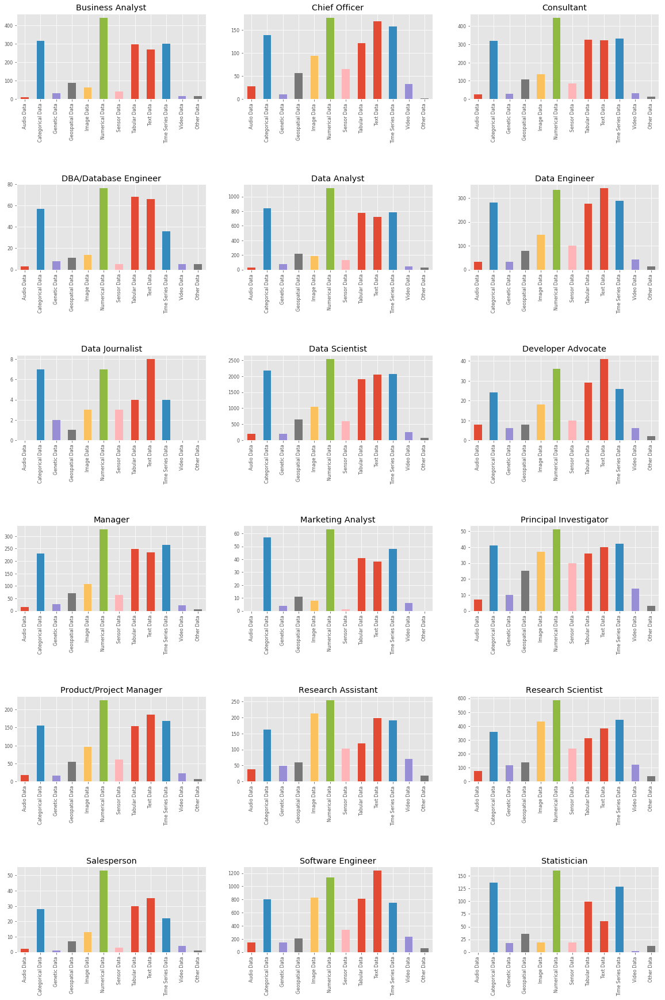

In [33]:
fig, ax = plt.subplots(nrows=6, ncols=3, sharex=True, sharey=True, figsize=(20, 30))
n = 1
for job in sum_datatype:
    plt.subplot(6, 3, n)
    sum_datatype[job].plot(kind="bar", title=job, fontsize=8)
    n +=1
plt.subplots_adjust(hspace = 1)
plt.show()